<a href="https://colab.research.google.com/github/Akshai-Athota/Food_Vision_Tensorflow/blob/main/Food_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-0a45ac6f-d857-f7c1-ddcf-5e1d2834f67c)


Download Data


In [ ]:
import tensorflow_datasets as tfds


In [ ]:
(train_data,test_data),data_info = tfds.load(name="food101",split=["train","validation"],
                                             as_supervised=True,shuffle_files=True,
                                             with_info=True)

In [ ]:
data_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})

Explore Data


In [ ]:
class_names = data_info.features["label"].names
class_names

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheesecake',
 'cheese_plate',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [ ]:
image_samples = train_data.take(3)

In [ ]:
type(image_samples)

tensorflow.python.data.ops.take_op._TakeDataset

In [ ]:
import tensorflow as tf
tf.__version__

'2.17.1'

In [ ]:
for image,label in image_samples:
  print(f'''
  image in tensor : {image}
  shape of the image : {image.shape}
  data type of the image : {image.dtype}
  label : {label}
  value of label : {class_names[label]}
  minimum pixel value : {tf.reduce_min(image)}
  maximum pixel value : {tf.reduce_max(image)}

  ''')


  image in tensor : [[[ 85  84  92]
  [ 86  85  93]
  [ 93  92 100]
  ...
  [120 196 245]
  [120 198 246]
  [121 199 247]]

 [[ 88  88  96]
  [ 82  82  90]
  [ 88  88  96]
  ...
  [116 192 244]
  [118 195 249]
  [119 196 248]]

 [[ 77  80  89]
  [ 75  78  87]
  [ 82  86  95]
  ...
  [115 189 252]
  [117 192 255]
  [118 194 255]]

 ...

 [[159 166 194]
  [154 161 187]
  [171 178 204]
  ...
  [219 216 235]
  [223 220 239]
  [227 226 244]]

 [[170 179 208]
  [169 179 206]
  [173 183 210]
  ...
  [218 217 235]
  [223 222 240]
  [226 227 245]]

 [[168 177 206]
  [170 179 208]
  [152 162 189]
  ...
  [224 223 241]
  [228 229 247]
  [231 232 250]]]
  shape of the image : (512, 512, 3)
  data type of the image : <dtype: 'uint8'>
  label : 16
  value of label : cheesecake
  minimum pixel value : 0
  maximum pixel value : 255

  

  image in tensor : [[[104 125 120]
  [ 99 118 114]
  [ 24  39  36]
  ...
  [113  49  24]
  [104  40  15]
  [114  50  25]]

 [[109 128 124]
  [111 130 126]
  [ 53  65

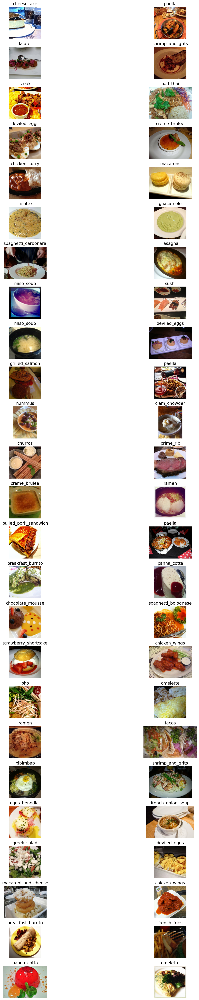

In [ ]:
import matplotlib.pyplot as plt

image_samples = train_data.take(50)

images_with_lables = [(image,label) for image, label in image_samples]

rows, cols = 25, 2

fig, axes = plt.subplots(rows, cols, figsize=(20, 50))

axes = axes.flatten()

for idx, ax in enumerate(axes):
    if idx < len(images_with_lables):
        img = images_with_lables[idx][0].numpy()
        ax.imshow(img)
        ax.set_title(class_names[images_with_lables[idx][1].numpy()],fontsize=15)
        ax.axis('off')
    else:
        ax.axis('off')  # Hide any empty subplot

plt.tight_layout()
plt.show()


Preprocessing Data

In [ ]:
def preprocess_image(image,label,image_shape = 224):
  image = tf.image.resize(image,[image_shape,image_shape])
  return tf.cast(image,tf.float32),label

In [ ]:
image_sample = train_data.take(1)
for image,label in image_sample:
  print(preprocess_image(image,label))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[ 93.      ,  34.      ,  40.      ],
        [ 94.      ,  35.      ,  41.      ],
        [ 95.      ,  36.      ,  42.      ],
        ...,
        [ 55.      ,  15.      ,  24.      ],
        [ 52.      ,  15.      ,  23.      ],
        [ 52.      ,  15.      ,  23.      ]],

       [[ 93.92857 ,  34.928574,  40.928574],
        [ 93.07143 ,  34.071426,  40.071426],
        [ 94.      ,  35.      ,  41.      ],
        ...,
        [ 55.      ,  15.      ,  24.      ],
        [ 54.      ,  14.      ,  23.      ],
        [ 52.      ,  15.      ,  23.      ]],

       [[ 93.928566,  35.357143,  41.57143 ],
        [ 91.64285 ,  33.071426,  39.285713],
        [ 91.78571 ,  33.214287,  39.428574],
        ...,
        [ 54.      ,  14.      ,  23.      ],
        [ 55.      ,  15.      ,  24.      ],
        [ 55.      ,  15.      ,  24.      ]],

       ...,

       [[108.01023 ,  31.010233,  49.01023 ],
        [108

In [ ]:
#train data
train_data = train_data.map(map_func=preprocess_image,num_parallel_calls=tf.data.AUTOTUNE)
train_data = train_data.shuffle(buffer_size=1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

#test data
test_data = test_data.map(map_func=preprocess_image,num_parallel_calls=tf.data.AUTOTUNE)
test_data = test_data.batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
train_data,test_data

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>)

Call Backs

In [ ]:
import datetime

def tensor_board_call_back(directory_path,experiment_name):

  log_dir = directory_path+"/"+experiment_name+"/"+datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  tensor_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
  print("creating tesnorboard call back")

  return tensor_callback


def model_check_point_callback(dir_name):
  print("creating model check point call back")
  return tf.keras.callbacks.ModelCheckpoint(filepath=dir_name,monitor='val_accuracy',save_best_only=True,save_weights_only=True,verbose=0)


Enable Mixed Precision

In [ ]:
from tensorflow.keras import mixed_precision

mixed_precision.set_global_policy(policy="mixed_float16")

In [ ]:
mixed_precision.global_policy()

<DTypePolicy "mixed_float16">

Build Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

input_shape = [224,224,3]
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

inputs = layers.Input(shape=input_shape,name="Input_layer")
x=base_model(inputs,training=False)
x=layers.GlobalAveragePooling2D(name="Pooling_Layer")(x)
x=layers.Dense(len(class_names))(x)
outputs = layers.Activation("softmax",dtype=tf.float32,name="Output_Layer")(x)

model = tf.keras.Model(inputs,outputs)
model.compile(loss="sparse_categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(),metrics=["accuracy"])

In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pooling_Layer                        │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 101)                 │         129,381 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_1 (Cast)                        │ (None, 101)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Output_Layer (Activation)            │ (None, 101)                 │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,178,952 (15.94 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
for layer in model.layers :
  print(f"{layer.name} {layer.dtype} {layer.dtype_policy}")

Input_layer float32 <DTypePolicy "mixed_float16">
efficientnetb0 float32 <DTypePolicy "mixed_float16">
Pooling_Layer float32 <DTypePolicy "mixed_float16">
dense float32 <DTypePolicy "mixed_float16">
Output_Layer float32 <DTypePolicy "float32">


In [ ]:
for layer in model.layers[1].layers :
  print(f"{layer.name} {layer.dtype} {layer.dtype_policy}")

input_layer float32 <DTypePolicy "mixed_float16">
rescaling float32 <DTypePolicy "mixed_float16">
normalization float32 <DTypePolicy "mixed_float16">
rescaling_1 float32 <DTypePolicy "mixed_float16">
stem_conv_pad float32 <DTypePolicy "mixed_float16">
stem_conv float32 <DTypePolicy "mixed_float16">
stem_bn float32 <DTypePolicy "mixed_float16">
stem_activation float32 <DTypePolicy "mixed_float16">
block1a_dwconv float32 <DTypePolicy "mixed_float16">
block1a_bn float32 <DTypePolicy "mixed_float16">
block1a_activation float32 <DTypePolicy "mixed_float16">
block1a_se_squeeze float32 <DTypePolicy "mixed_float16">
block1a_se_reshape float32 <DTypePolicy "mixed_float16">
block1a_se_reduce float32 <DTypePolicy "mixed_float16">
block1a_se_expand float32 <DTypePolicy "mixed_float16">
block1a_se_excite float32 <DTypePolicy "mixed_float16">
block1a_project_conv float32 <DTypePolicy "mixed_float16">
block1a_project_bn float32 <DTypePolicy "mixed_float16">
block2a_expand_conv float32 <DTypePolicy "m

In [ ]:
tf.get_logger().setLevel("ERROR")

histroy_101_Food_vision_base_model = model.fit(train_data,epochs=3,steps_per_epoch=int(len(train_data)+1),
                                               validation_data=test_data,validation_steps=int((0.15*len(test_data))),
                                               callbacks=[tensor_board_call_back("train_log","base_model_food_vision"),
                                                          model_check_point_callback("model_checkpoint/food_vision_base_mode.weights.h5")])

creating tesnorboard call back
creating model check point call back
Epoch 1/3
2368/2369 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.5086 - loss: 2.0933

/usr/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


2369/2369 ━━━━━━━━━━━━━━━━━━━━ 197s 82ms/step - accuracy: 0.5087 - loss: 2.0932 - val_accuracy: 0.6629 - val_loss: 1.2840
Epoch 2/3
2369/2369 ━━━━━━━━━━━━━━━━━━━━ 185s 76ms/step - accuracy: 0.6326 - loss: 1.4392 - val_accuracy: 0.6827 - val_loss: 1.1881
Epoch 3/3
2369/2369 ━━━━━━━━━━━━━━━━━━━━ 192s 80ms/step - accuracy: 0.6660 - loss: 1.2801 - val_accuracy: 0.6923 - val_loss: 1.1326


In [ ]:
first_model = model

In [ ]:
base_model_result = model.evaluate(test_data)
base_model_result

790/790 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.6792 - loss: 1.1986


[1.1923810243606567, 0.6805940866470337]

In [ ]:
base_model_result[1]*100

68.05940866470337

Data Agumentation And Fine Tuning

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import EfficientNetB0

data_agumentation = Sequential([
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.2),
  layers.RandomHeight(0.2),
  layers.RandomWidth(0.2),
  layers.RandomZoom(0.2),
  layers.RandomContrast(0.2)
],name="data_agumentation_layer")

base_model = EfficientNetB0(include_top=False)
base_model.trainable = False

inputs= layers.Input(shape=[224,224,3],name="input_layer")
x=data_agumentation(inputs)
x=base_model(x,training=False)
x=layers.GlobalAveragePooling2D(name="pooling_layer")(x)
x=layers.Dense(200,name="first_desnse_layer")(x)
x=layers.Dropout(0.2)(x)
x=layers.Dense(150,name="second_desnse_layer")(x)
x=layers.Dropout(0.3)(x)
x=layers.Dense(len(class_names),name="final_dense_layer")(x)
outputs = layers.Activation("softmax",dtype=tf.float32,name="output_layer")(x)

model_agumented = tf.keras.Model(inputs,outputs)
model_agumented.compile(loss="sparse_categorical_crossentropy",optimizer=tf.keras.optimizers.Adam(),metrics=["accuracy"])

In [ ]:
model_agumented.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_3 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_agumentation_layer (Sequential) │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, None, None, 1280)    │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pooling_layer                        │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ first_desnse_layer (Dense)           │ (None, 200)                 │         256,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 200)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ second_desnse_layer (Dense)          │ (None, 150)                 │          30,150 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ final_dense_layer (Dense)            │ (None, 101)                 │          15,251 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_4 (Cast)                        │ (None, 101)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Activation)            │ (None, 101)                 │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,351,172 (16.60 MB)

 Trainable params: 301,601 (1.15 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
checkpoint_path = "model_checkpoint/food_vision_augemented_model.weights.h5"
intail_epoch = 3


history_101_Food_vision_agumented = model_agumented.fit(train_data,epochs=intail_epoch,steps_per_epoch=int(len(train_data)),
                                                        validation_data=test_data,validation_steps=int((0.10*len(test_data))),
                                                        callbacks=[tensor_board_call_back("train_log","agumented_model_food_vision"),
                                                          model_check_point_callback(checkpoint_path)])

creating tesnorboard call back
creating model check point call back
Epoch 1/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 437s 177ms/step - accuracy: 0.2819 - loss: 3.0658 - val_accuracy: 0.5494 - val_loss: 1.6739
Epoch 2/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.5692 - val_loss: 1.6417
Epoch 3/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 340s 142ms/step - accuracy: 0.4226 - loss: 2.3673 - val_accuracy: 0.5938 - val_loss: 1.5063


In [ ]:
agumented_result=  model_agumented.evaluate(test_data)
agumented_result

790/790 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.5880 - loss: 1.5249


[1.5235109329223633, 0.5902970433235168]

In [ ]:
fine_tune_model =  model_agumented
fine_tune_check_point = "model_checkpoint/food_vision_fine_tune_model.weights.h5"
fine_tune_epochs = intail_epoch + 10

for layer in fine_tune_model.layers[2].layers[-10:]:
  layer.trainable = True

fine_tune_model.compile(loss="sparse_categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(0.0001),metrics=["accuracy"])


In [ ]:
fine_tune_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_3 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_agumentation_layer (Sequential) │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, None, None, 1280)    │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pooling_layer                        │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ first_desnse_layer (Dense)           │ (None, 200)                 │         256,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 200)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ second_desnse_layer (Dense)          │ (None, 150)                 │          30,150 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ final_dense_layer (Dense)            │ (None, 101)                 │          15,251 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_4 (Cast)                        │ (None, 101)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Activation)            │ (None, 101)                 │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,351,172 (16.60 MB)

 Trainable params: 1,194,833 (4.56 MB)

 Non-trainable params: 3,156,339 (12.04 MB)

In [ ]:
histor_101_food_vision_fine_tune_model = fine_tune_model.fit(train_data,epochs=13,steps_per_epoch=int(tf.round(len(train_data))),
                                                        validation_data=test_data,validation_steps=int(tf.round((0.10*len(test_data)))),initial_epoch=intail_epoch,
                                                        callbacks=[tensor_board_call_back("train_log","agumented_model_food_vision"),
                                                          model_check_point_callback(fine_tune_check_point)])

creating tesnorboard call back
creating model check point call back
Epoch 4/13
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 318s 126ms/step - accuracy: 0.4559 - loss: 2.1885 - val_accuracy: 0.6483 - val_loss: 1.2914
Epoch 5/13


/usr/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


2368/2368 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6472 - val_loss: 1.2819
Epoch 6/13
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 275s 115ms/step - accuracy: 0.5152 - loss: 1.9171 - val_accuracy: 0.6871 - val_loss: 1.1744
Epoch 7/13
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6752 - val_loss: 1.1948
Epoch 8/13
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 301s 108ms/step - accuracy: 0.5389 - loss: 1.8113 - val_accuracy: 0.6899 - val_loss: 1.1084
Epoch 9/13
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6911 - val_loss: 1.1604
Epoch 10/13
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 260s 109ms/step - accuracy: 0.5595 - loss: 1.7133 - val_accuracy: 0.6982 - val_loss: 1.1324
Epoch 11/13
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6986 - val_loss: 1.0932
Epoch 12/13
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 241s 101ms/s

In [ ]:
fine_tune_results = fine_tune_model.evaluate(test_data)
fine_tune_results

790/790 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.6953 - loss: 1.1030


[1.1026779413223267, 0.6936633586883545]

In [ ]:
fine_tune_model_1 =  model_agumented
fine_tune_check_point_1 = "model_checkpoint/food_vision_fine_tune_model_1.weights.h5"
fine_tune_epochs = intail_epoch + 10

for layer in fine_tune_model_1.layers[2].layers[-20:]:
  layer.trainable = True

fine_tune_model_1.compile(loss="sparse_categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(0.0001),metrics=["accuracy"])

In [ ]:
histor_101_food_vision_fine_tune_model = fine_tune_model_1.fit(train_data,epochs=15,steps_per_epoch=int(tf.round(len(train_data))+2),
                                                        validation_data=test_data,validation_steps=int(tf.round((0.10*len(test_data)))+2),initial_epoch=intail_epoch,
                                                        callbacks=[tensor_board_call_back("train_log","fine_tune_model_1_food_vision"),
                                                          model_check_point_callback(fine_tune_check_point)])

creating tesnorboard call back
creating model check point call back
Epoch 4/15
2368/2370 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - accuracy: 0.5437 - loss: 1.7882

/usr/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


2370/2370 ━━━━━━━━━━━━━━━━━━━━ 272s 106ms/step - accuracy: 0.5437 - loss: 1.7882 - val_accuracy: 0.7014 - val_loss: 1.0815
Epoch 5/15
2370/2370 ━━━━━━━━━━━━━━━━━━━━ 245s 102ms/step - accuracy: 0.5862 - loss: 1.5990 - val_accuracy: 0.7068 - val_loss: 1.0613
Epoch 6/15
2370/2370 ━━━━━━━━━━━━━━━━━━━━ 241s 101ms/step - accuracy: 0.6057 - loss: 1.5116 - val_accuracy: 0.7238 - val_loss: 1.0011
Epoch 7/15
2370/2370 ━━━━━━━━━━━━━━━━━━━━ 259s 100ms/step - accuracy: 0.6167 - loss: 1.4527 - val_accuracy: 0.7284 - val_loss: 0.9511
Epoch 8/15
2370/2370 ━━━━━━━━━━━━━━━━━━━━ 239s 100ms/step - accuracy: 0.6316 - loss: 1.3951 - val_accuracy: 0.7446 - val_loss: 0.9189
Epoch 9/15
2370/2370 ━━━━━━━━━━━━━━━━━━━━ 238s 99ms/step - accuracy: 0.6382 - loss: 1.3588 - val_accuracy: 0.7411 - val_loss: 0.9350
Epoch 10/15
2370/2370 ━━━━━━━━━━━━━━━━━━━━ 238s 99ms/step - accuracy: 0.6506 - loss: 1.3108 - val_accuracy: 0.7396 - val_loss: 0.9342
Epoch 11/15
2370/2370 ━━━━━━━━━━━━━━━━━━━━ 260s 98ms/step - accuracy: 0.65

In [ ]:
final_results = fine_tune_model_1.evaluate(test_data)
final_results

790/790 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - accuracy: 0.7522 - loss: 0.9029


[0.9017373919487, 0.7508910894393921]

In [ ]:
final_results[1]*100

75.08910894393921

Predict Results

In [ ]:
model = fine_tune_model_1

In [ ]:
test_samples = test_data.take(1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


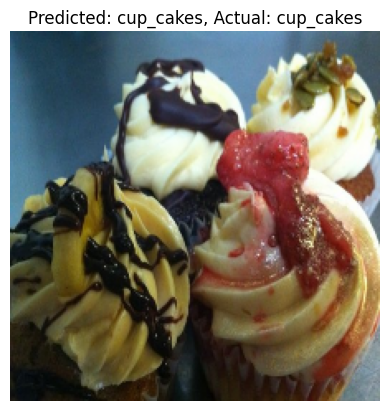

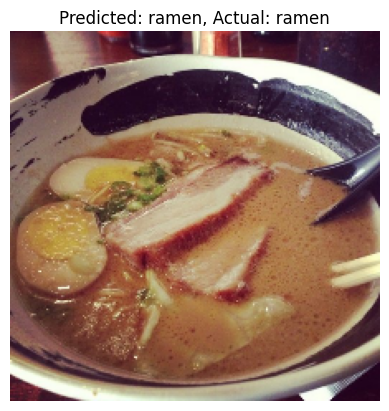

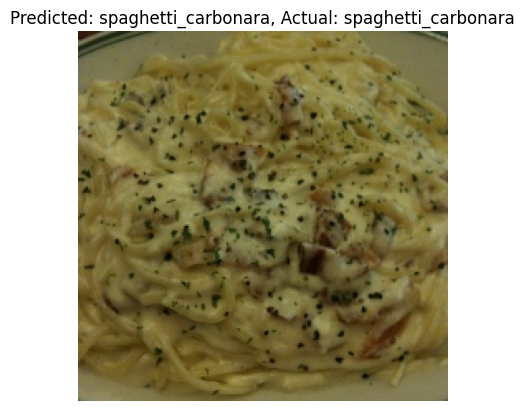

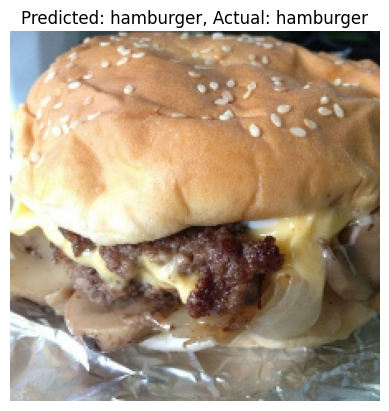

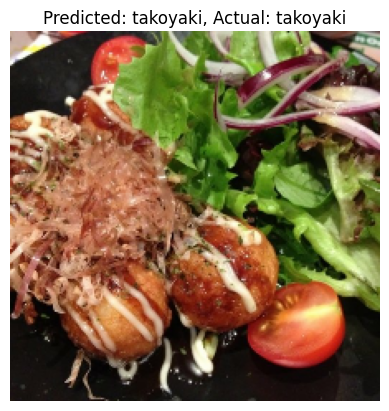

...

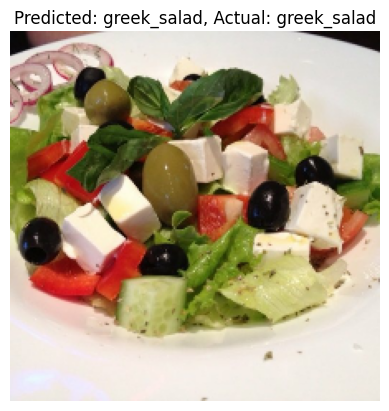

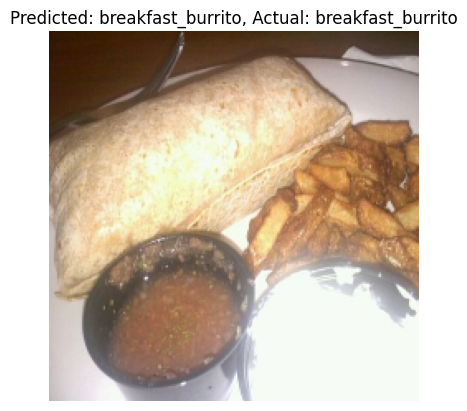

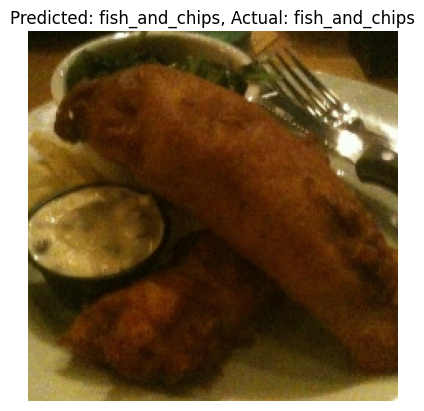

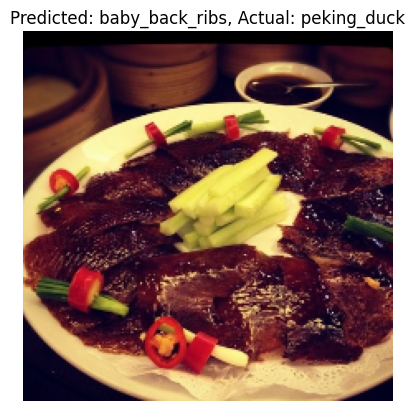

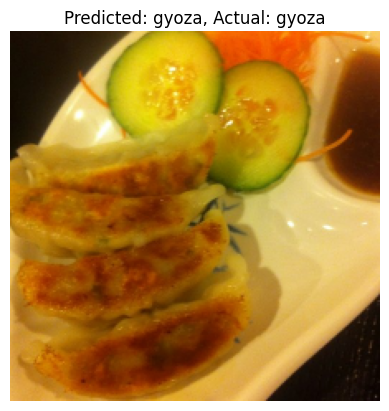

In [ ]:
import numpy as np

for image,label in test_samples:
  predictions=model.predict(image)
  predicted_labels = np.argmax(predictions,axis=1)

  actual_labels = label.numpy()

  for i in range(image.shape[0]):
      plt.figure()
      plt.imshow(image[i].numpy().astype(np.uint8))

      title = f"Predicted: {class_names[predicted_labels[i]]}, Actual: {class_names[actual_labels[i]]}"
      plt.title(title)

      plt.axis('off')  # Hide axis ticks
      plt.show()